<a href="https://colab.research.google.com/github/pg70184/project1/blob/master/pubg_final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('pubg-final-project')
jovian.set_colab_id('1aF7ELbF9UXj5ws_aOFjrhvuLuXU4CBcf')

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: 

# pubg-final-project

PUBG is a battle Royal game with the goal of being a finalist in the match. The game has multiple modes `SOLO`, `DUO`, `SQUADS`. In BATTLEGROUNDS typically players begin a match with 100 players. Here is some gameplay:


1.   https://www.youtube.com/watch?v=lsXMumRLo6I

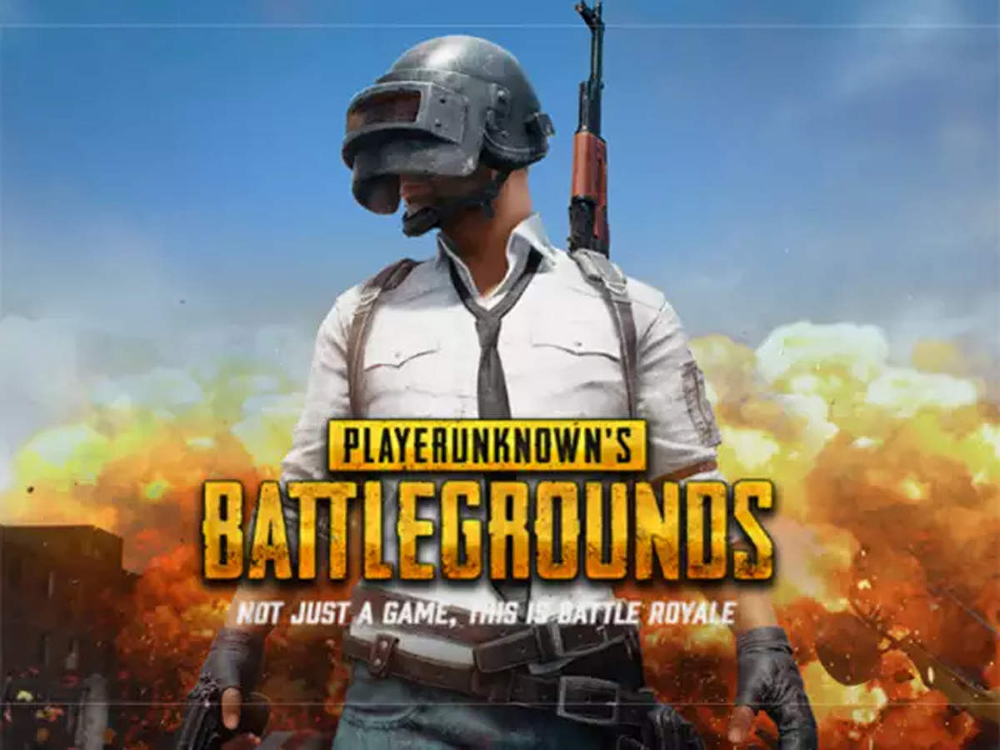



First thing we perform is downloading the dataset through Kaggle. This can be done in one of two ways:

1.   Downloading the respective CSV files and uploading them to the Colab (IDE)
2.   Downloading Directly from Kaggle.


I Performed the Later, In my opinion it is more efficent then directly downloading the respective datasets

In [ ]:
!pip install opendatasets --upgrade --q
import os
import opendatasets as od

This command will download the data

In [ ]:
pub_g_data = 'https://www.kaggle.com/c/pubg-finish-placement-prediction/data'
od.download(pub_g_data)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: prathameshgawade
Your Kaggle Key: ··········


100%|██████████| 361M/361M [00:06<00:00, 62.3MB/s]



Extracting archive ./pubg-finish-placement-prediction/pubg-finish-placement-prediction.zip to ./pubg-finish-placement-prediction


Next we see the files in this download. We notice there are two files containing the same number of respective columns, but differ in their number of rows. This is because one is meant to be the training data set while the other is the test data set.

In [ ]:
os.listdir('pubg-finish-placement-prediction')

['sample_submission_V2.csv', 'test_V2.csv', 'train_V2.csv']

In [ ]:
import pandas as pd
import numpy as np

train_df = pd.read_csv('pubg-finish-placement-prediction/train_V2.csv')
test_df = pd.read_csv('pubg-finish-placement-prediction/test_V2.csv')
sample_df = pd.read_csv('pubg-finish-placement-prediction/sample_submission_V2.csv')

Next I wanted to see the respective shapes of the data frames. As we can see the training set has significantly more data as mentioned before

In [ ]:
train_df.shape


(4446966, 29)

In [ ]:
test_df.shape

(1934174, 28)

In [ ]:
sample_df.shape

(1934174, 2)

Next I printed out the training data so we can see the respective columns.

In [ ]:
train_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.000,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.040,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.000,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.000,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.000,0,0,49.75,2,0,0.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446961,afff7f652dbc10,d238e426f50de7,18492834ce5635,0,0,0.00,0,0,0,74,1029,0,0,0.00,1873,squad-fpp,29,28,-1,0,1292.0000,0,0.000,0,0,1019.00,3,1507,0.1786
4446962,f4197cf374e6c0,408cdb5c46b2ac,ee854b837376d9,0,1,44.15,0,0,0,69,0,0,0,0.00,1435,solo,93,93,1501,0,0.0000,0,0.000,0,0,81.70,6,0,0.2935
4446963,e1948b1295c88a,e26ac84bdf7cef,6d0cd12784f1ab,0,0,59.06,0,0,0,66,0,0,0,0.00,1321,squad-fpp,28,28,1500,0,0.0000,0,2.184,0,0,788.70,4,0,0.4815
4446964,cc032cdd73b7ac,c2223f35411394,c9c701d0ad758a,0,4,180.40,1,1,2,11,0,2,1,98.50,1373,squad-fpp,26,25,1418,2,0.0000,0,0.000,0,0,2748.00,8,0,0.8000


In [ ]:
test_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,0,0,0,0.00,1884,squad-fpp,28,28,1500,0,0.0,0,0.000,0,0,588.00,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,0,2,1,361.90,1811,duo-fpp,48,47,1503,2,4669.0,0,0.000,0,0,2017.00,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,0,0,0,0.00,1793,squad-fpp,28,27,1565,0,0.0,0,0.000,0,0,787.80,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,0,0,0,0.00,1834,duo-fpp,45,44,1465,0,0.0,0,0.000,0,0,1812.00,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,0,3,1,60.06,1326,squad-fpp,28,27,1480,1,0.0,0,0.000,0,0,2963.00,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1934169,a316c3a13887d5,80e82180c90951,f276da5fd73536,1,2,381.00,3,0,7,4,1294,4,2,69.27,1292,squad-fpp,22,20,-1,1,0.0,0,0.000,0,0,1799.00,5,1526
1934170,5312146b27d875,147264a127c56e,fb77cbfe094a6b,0,0,0.00,0,0,0,64,1449,0,0,0.00,1301,squad-fpp,27,26,-1,0,0.0,0,0.000,0,0,1195.00,3,1496
1934171,fc8818b5b32ad3,7bbb4779ebedd5,efb74d5f6e9779,0,0,91.96,0,0,3,24,0,1,1,25.38,1314,squad-fpp,29,29,1482,0,0.0,0,7.798,1,0,3327.00,3,0
1934172,a0f91e35f8458f,149a506a64c2b1,3a2cf335bc302f,1,2,138.60,0,0,12,25,0,1,1,67.89,1333,duo-fpp,49,48,1456,1,0.0,0,0.000,0,0,1893.00,4,0


In [ ]:
sample_df

,Id,winPlacePerc
0,9329eb41e215eb,1
1,639bd0dcd7bda8,1
2,63d5c8ef8dfe91,1
3,cf5b81422591d1,1
4,ee6a295187ba21,1
...,...,...
1934169,a316c3a13887d5,1
1934170,5312146b27d875,1
1934171,fc8818b5b32ad3,1
1934172,a0f91e35f8458f,1


# Cleaning Data

### Next we are going to 'clean up the data' We will check for missing values as well as remove uncessesary columns

In [ ]:
train_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.000,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.040,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.000,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.000,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.000,0,0,49.75,2,0,0.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446961,afff7f652dbc10,d238e426f50de7,18492834ce5635,0,0,0.00,0,0,0,74,1029,0,0,0.00,1873,squad-fpp,29,28,-1,0,1292.0000,0,0.000,0,0,1019.00,3,1507,0.1786
4446962,f4197cf374e6c0,408cdb5c46b2ac,ee854b837376d9,0,1,44.15,0,0,0,69,0,0,0,0.00,1435,solo,93,93,1501,0,0.0000,0,0.000,0,0,81.70,6,0,0.2935
4446963,e1948b1295c88a,e26ac84bdf7cef,6d0cd12784f1ab,0,0,59.06,0,0,0,66,0,0,0,0.00,1321,squad-fpp,28,28,1500,0,0.0000,0,2.184,0,0,788.70,4,0,0.4815
4446964,cc032cdd73b7ac,c2223f35411394,c9c701d0ad758a,0,4,180.40,1,1,2,11,0,2,1,98.50,1373,squad-fpp,26,25,1418,2,0.0000,0,0.000,0,0,2748.00,8,0,0.8000


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4446966 entries, 0 to 4446965
Data columns (total 29 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Id               object 
 1   groupId          object 
 2   matchId          object 
 3   assists          int64  
 4   boosts           int64  
 5   damageDealt      float64
 6   DBNOs            int64  
 7   headshotKills    int64  
 8   heals            int64  
 9   killPlace        int64  
 10  killPoints       int64  
 11  kills            int64  
 12  killStreaks      int64  
 13  longestKill      float64
 14  matchDuration    int64  
 15  matchType        object 
 16  maxPlace         int64  
 17  numGroups        int64  
 18  rankPoints       int64  
 19  revives          int64  
 20  rideDistance     float64
 21  roadKills        int64  
 22  swimDistance     float64
 23  teamKills        int64  
 24  vehicleDestroys  int64  
 25  walkDistance     float64
 26  weaponsAcquired  int64  
 27  winPoints   

In train_df we see that the values `Id`, `groupId` and `matchId` all have no bearing on predicting a WinPlace thus we wil omit these columns

# Visualizing Trends

### Now we are going to use the libraries `seaborn` and `matplotlib` to visualize the data

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

I decided to make the sample size smaller, this was due to the fact my cells were taking far too long to execute 4 mil + data points, thus I reduced the sample size to 250K. This is still large enough to draw resonable conclusions from the data

In [ ]:
train_df = train_df.sample(250000, random_state = 42)

Accordingly our test sample cannot be as large thus we are going to give that a value of 50000

In [ ]:
test_df = test_df.sample(50000, random_state = 42)

In [ ]:
train_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
4289863,ab772932dc284b,6f0931849c42fc,7558d7990b8795,0,0,161.30,3,2,0,7,1607,4,3,41.54,1377,squad-fpp,29,29,-1,1,0.0,0,0.0,0,0,565.30,2,1660,0.3929
3353859,f6e963587e1e61,f2724371458701,55d030157d6eb8,0,3,191.50,1,1,4,7,0,3,1,4.14,899,crashfpp,40,38,1500,0,1580.0,1,0.0,0,0,532.60,3,0,0.6923
1660760,eae2ba6cc7de4c,a8ddca0c7e8f74,0cf8e1dc70559e,0,2,100.00,0,0,1,24,1700,1,1,64.25,1324,solo-fpp,97,97,-1,0,450.7,0,0.0,0,0,1607.00,6,1593,0.7083
2555773,36d45a7e95b913,916c4c31723cdb,7b572f22974581,0,0,0.00,0,0,0,86,0,0,0,0.00,1307,squad,27,24,1500,0,0.0,0,0.0,0,0,134.60,1,0,0.1154
363725,aa5867db86503b,76d57fc80f70f2,fc69844a437eae,3,2,289.90,2,0,9,14,0,2,1,22.46,1864,squad-fpp,28,26,1456,1,3950.0,0,0.0,0,0,2131.00,5,0,0.8148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2998773,1a7a6ec97bf3f2,dfc6ac1db8b9fb,fcad6c3fdd847a,2,0,816.30,0,2,10,4,1000,8,2,19.90,895,normal-solo-fpp,8,6,-1,0,0.0,0,0.0,0,0,222.70,24,1500,0.5714
898874,95fa9b2c7e0223,d2ea2f9b1b0d4c,ce88f9c8c35bdf,0,0,189.20,0,0,0,20,0,2,1,30.39,1889,solo-fpp,95,93,1500,0,3275.0,0,0.0,0,0,323.80,4,0,0.4255
2728503,457f3239d9d7f4,4d042994edfa61,58f6d599879a93,1,1,24.48,0,0,1,53,0,0,0,0.00,1397,squad,28,28,1534,0,0.0,0,0.0,0,0,1212.00,8,0,0.6296
3257687,bf9b996c52e47f,e8163cfc5cc00f,b90a6434bcea92,1,2,140.30,1,0,1,25,0,1,1,10.38,1772,duo-fpp,47,44,1502,0,717.0,0,0.0,0,0,3318.00,7,0,0.7609


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 250000 entries, 4289863 to 4240724
Data columns (total 29 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Id               250000 non-null  object 
 1   groupId          250000 non-null  object 
 2   matchId          250000 non-null  object 
 3   assists          250000 non-null  int64  
 4   boosts           250000 non-null  int64  
 5   damageDealt      250000 non-null  float64
 6   DBNOs            250000 non-null  int64  
 7   headshotKills    250000 non-null  int64  
 8   heals            250000 non-null  int64  
 9   killPlace        250000 non-null  int64  
 10  killPoints       250000 non-null  int64  
 11  kills            250000 non-null  int64  
 12  killStreaks      250000 non-null  int64  
 13  longestKill      250000 non-null  float64
 14  matchDuration    250000 non-null  int64  
 15  matchType        250000 non-null  object 
 16  maxPlace         250000 non-nul

As we can see when running df.info we are fortunate to not run into any null values. In the instance there were null values we would have performed some kind of imputation

In [ ]:
 px.scatter((train_df),
           title = 'headshotKills vs winPlacePerc',
           x = 'winPlacePerc',
           y = 'headshotKills',)

In [ ]:
px.histogram(train_df,
             x = 'matchType',
             marginal = 'box',
             color_discrete_sequence = ['cornflowerblue'],
             title = 'Number of Match Type data points')

              

During instances where there are many data points, a heatmap is a useful tool to see any kinds of correlations. (Not just with the target column and respective vectors, but also with the respective vectors amoungst themselves

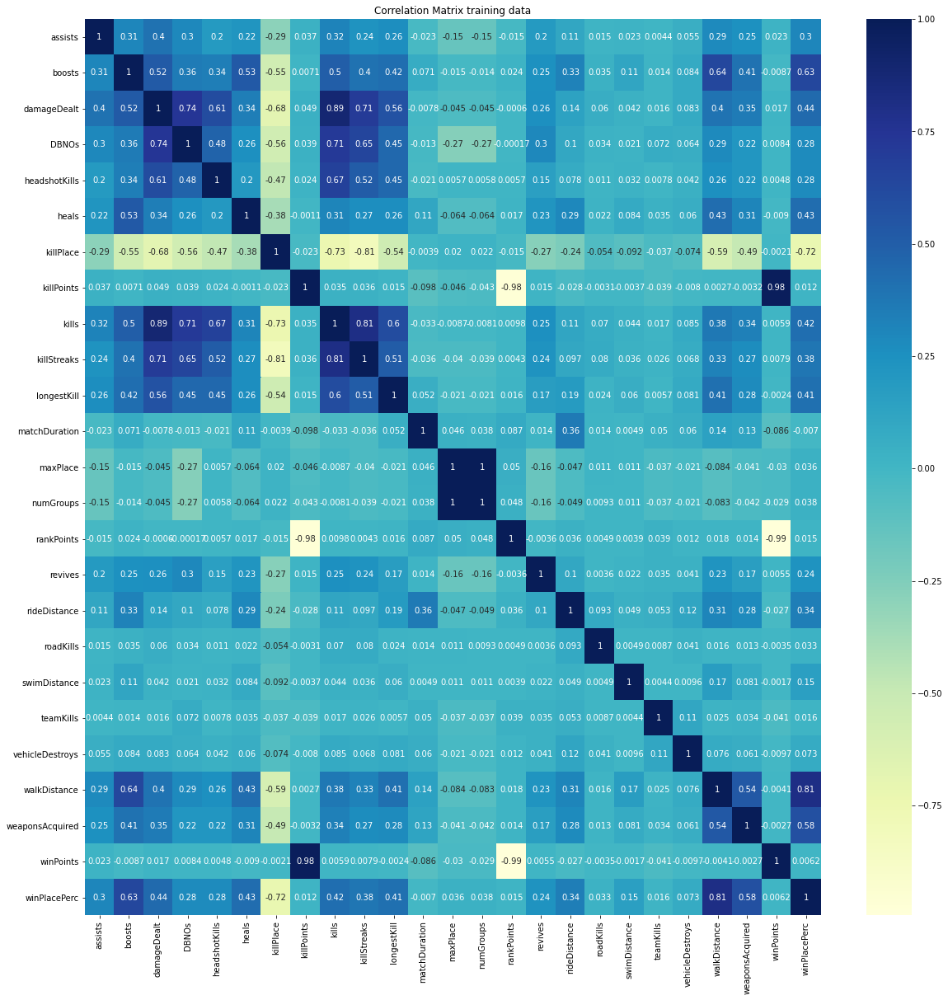

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(train_df.corr(), cmap="YlGnBu", annot=True)
plt.title('Correlation Matrix training data');

A heat map is a very powerful tool. We can check out correlations between various data points. A heat map still has its limitations however, as it just gives us an indication of linearly negative/positive relationships. It doesn't take into account quadratic relationships, gaussian, or logarithmic. 

I found the last row `winPlacePerc` the most intresting. We can see which parameters have a strong linear correlation with `winPlacePerc`. As we cab see `walkDistance`, `WeaponsAcquired`, and `boosts` all have a strong positive correlation with `winPlacePerc`. Intrestingly enough `killplace` has a strong negative relationship with `winPlacePerc`

In [ ]:
 jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/pg70184/pubg-final-project


'https://jovian.ai/pg70184/pubg-final-project'

# Inputs and Targets

In here I begin to take out any cells that don't have any bearing on predicting the target data. I also orginize which of the cells will hold the target columns

In [ ]:
input_cols, target_col = train_df.columns[3:-1], train_df.columns[-1]

1.   I had used `[-1]` for the target columns because that would take the cell  the negative direction in 
2.   I had used `[3:-1]` for the input columns this was due to removing the unessesary columns in the beggining that simply contained redundant player info.


In [ ]:
inputs_df, targets = train_df[input_cols].copy(), train_df[target_col].copy()

`OneHotEncoder` will orginize the values within a range of 0 to 1. This allows for better predictive analyisis for machine learning algorithms when creating respective weights. 

In [ ]:
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 250000 entries, 4289863 to 4240724
Data columns (total 29 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Id               250000 non-null  object 
 1   groupId          250000 non-null  object 
 2   matchId          250000 non-null  object 
 3   assists          250000 non-null  int64  
 4   boosts           250000 non-null  int64  
 5   damageDealt      250000 non-null  float64
 6   DBNOs            250000 non-null  int64  
 7   headshotKills    250000 non-null  int64  
 8   heals            250000 non-null  int64  
 9   killPlace        250000 non-null  int64  
 10  killPoints       250000 non-null  int64  
 11  kills            250000 non-null  int64  
 12  killStreaks      250000 non-null  int64  
 13  longestKill      250000 non-null  float64
 14  matchDuration    250000 non-null  int64  
 15  matchType        250000 non-null  object 
 16  maxPlace         250000 non-nul

In [ ]:
categorical_cols = inputs_df.select_dtypes(include='object').columns.tolist()

In [ ]:
categorical_cols

['matchType']

In [ ]:
numeric_cols = inputs_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

In [ ]:
numeric_cols

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'maxPlace',
 'numGroups',
 'rankPoints',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints']

In [ ]:
encoder=OneHotEncoder(sparse=False,handle_unknown='ignore').fit(inputs_df[categorical_cols])

In [ ]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))

In [ ]:
inputs_df[encoded_cols] = encoder.transform(inputs_df[categorical_cols])

In [ ]:
# Create training and validation sets
train_inputs, val_inputs, train_targets, val_targets = train_test_split(
    inputs_df[numeric_cols + encoded_cols], targets, test_size=0.10, random_state=42)

# Decision Tree Regressor

The first ML algorithm I created was a Decision Tree Regressor. Decision Tree Regressors behave in such a fashion: " A decision tree is built on an entire dataset, using all the features/variables of interest"



1.   https://stats.stackexchange.com/questions/285834/difference-between-random-forests-and-decision-tree
2.   https://scikit-learn.org/stable/modules/tree.html#tree


In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
# Create the model
tree = DecisionTreeRegressor(random_state = 42)

In [ ]:
# Fit the model to the training data
tree.fit(train_inputs, train_targets)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/pg70184/pubg-final-project


'https://jovian.ai/pg70184/pubg-final-project'

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
tree_train_preds = tree.predict(train_inputs)

In [ ]:
tree_train_rmse = np.sqrt(mean_squared_error(train_targets, tree_train_preds))

In [ ]:
tree_val_preds = tree.predict(val_inputs)

In [ ]:
tree_val_rmse = np.sqrt(mean_squared_error(val_targets, tree_val_preds))

In [ ]:
print('Train RMSE: {}, Validation RMSE: {}'.format(tree_train_rmse, tree_val_rmse))

Train RMSE: 2.0519105442049224e-05, Validation RMSE: 0.12442190714585337


In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree, export_text
import seaborn as sns
sns.set_style('darkgrid')
%matplotlib inline

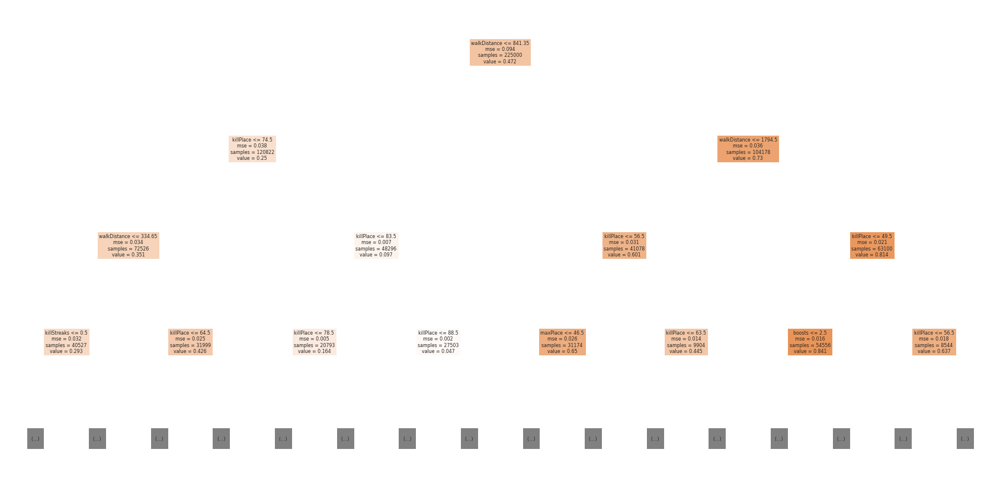

In [ ]:
plt.figure(figsize=(30,15))

# Visualize the tree graphically using plot_tree
plot_tree(tree, feature_names = train_inputs.columns, max_depth = 3, filled = True);

In [ ]:
# Visualize the tree textually using export_text
tree_text = export_text(tree, max_depth = 10, feature_names = list(train_inputs.columns))

In [ ]:
# Check feature importance
tree_importances = tree.feature_importances_

In [ ]:
tree_importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': tree_importances
}).sort_values('importance', ascending=False)

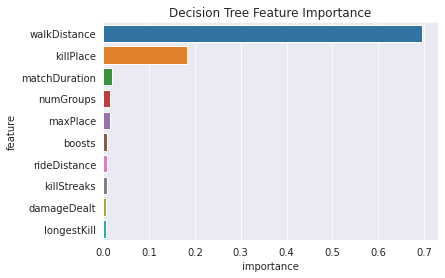

In [ ]:
plt.title('Decision Tree Feature Importance')
sns.barplot(data=tree_importance_df.head(10), x='importance', y='feature');

As we see here diffrent paramters in the data set have varying effects on the outcome of a win. We can see `WalkDistance` played the biggest factor. This would accordingly make sense because the game requires fast movement. A player who is winning often moves around the map quite often. `killPlace` was the second determining factor. This makes sense as well because a player getting maximun skills would tend to be the most skilled

# Random Forest Regressor

The second training type I performed is a Random Forest Regressor. Since both methods have diffrent approches 



1.   https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html



In [ ]:
#First we Import the RandomForestRegressor using sklearn

from sklearn.ensemble import RandomForestRegressor

In [ ]:
#Creating the RandomForestRegressor Model

rf1 = RandomForestRegressor(n_jobs = 1, random_state = 42)

Next we are going to add the training inputs and the training targets as we had before

In [ ]:
rf1.fit(train_inputs, train_targets)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=1, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

Here we ran the random forest regressor with the training targets and inputs. Accordingly the score was very high (A 99% accuracy). This is because we would expect the model to do well on targets it knows the values of

In [ ]:
rf1.score(train_inputs, train_targets)

0.9889340503456842

In [ ]:
rf1_train_preds = rf1.predict(train_inputs)

In [ ]:
rf1_train_rmse = np.sqrt(mean_squared_error(train_targets, rf1_train_preds))

In [ ]:
rfl_val_preds = rf1.predict(val_inputs)

In [ ]:
rf1_val_rmse = np.sqrt(mean_squared_error(val_targets, rfl_val_preds))

In [ ]:
print('Train RMSE: {}, Validation RMSE: {}'.format(rf1_train_rmse, rf1_val_rmse))

Train RMSE: 0.03233198015715765, Validation RMSE: 0.08635638210190286


We can see that there is a bit of overfitting going on here. Both RMSE are realtivley low, however the training data is quite a bit less thant he validation set. This is what we would expect consequently given the nature that this is the first Random forest Regression we ran. Next we are going to attempt to Hypertune the data and see if we can find a better behaving forest model that minimizes RMSE for both the training and validation

In [ ]:
def test_params(**params):
    model = RandomForestRegressor(random_state=42, n_jobs=-1, **params).fit(train_inputs, train_targets)
    train_rmse = mean_squared_error(model.predict(train_inputs), train_targets, squared=False)
    val_rmse = mean_squared_error(model.predict(val_inputs), val_targets, squared=False)
    return train_rmse, val_rmse

In [ ]:
test_params(n_estimators=20, max_depth=20)

(0.046736759849024305, 0.08800229706470661)

In [ ]:
test_params(n_estimators=50, max_depth=10, min_samples_leaf=4, max_features=0.4)

(0.09291794230640099, 0.0960725371711327)

In [ ]:
def test_param_and_plot(param_name, param_values):
    train_errors, val_errors = [], [] 
    for value in param_values:
        params = {param_name: value}
        train_rmse, val_rmse = test_params(**params)
        train_errors.append(train_rmse)
        val_errors.append(val_rmse)
    plt.figure(figsize=(15,10))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, 'b-o')
    plt.plot(param_values, val_errors, 'r-o')
    plt.xlabel(param_name)
    plt.ylabel('RMSE')
    plt.legend(['Training', 'Validation'])

In [ ]:
test_param_and_plot('max_depth', [5, 7, 10, 15, 20])

In [ ]:
jovian.commit()

# Test Data

Here we are ready to submit and test our final results with this project. We can see that even by using a relativley simple sample the models were able to perform quite well. If we were to spend more time and make more complex structures I am sure the accuracy would have increased

In [ ]:
test_df = pd.read_csv('pubg-finish-placement-prediction/test_V2.csv')

In [ ]:
test_df

In [ ]:
rf2.score(val_inputs, val_targets)

In [ ]:
test_inputs = test_df[numeric_cols + encoded_cols]

In [ ]:
test_preds = rf2.predict(test_inputs)

In [ ]:
submission_df

In [ ]:
submission_df['winPlacePerc'] = test_preds

In [ ]:
submission_df.to_csv('submission.csv', index=False)

In [ ]:
def predict_input(model, single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols].values)
    return model.predict(input_df[numeric_cols + encoded_cols])[0]

In [ ]:
test_inputs = test_df[numeric_cols + encoded_cols]

In [ ]:
test_preds = rf1.predict(test_inputs)

In [ ]:
jovian.commit()

Work Cited:


1.   https://jovian.ai/learn/machine-learning-with-python-zero-to-gbms/assignment/assignment-2-decision-trees-and-random-forests
2.   https://jovian.ai/learn/machine-learning-with-python-zero-to-gbms/lesson/random-forests-and-regularization
3.   https://jovian.ai/learn/machine-learning-with-python-zero-to-gbms/lesson/logistic-regression-for-classification
4. https://scikit-learn.org/stable/modules/tree.html#tree
5. https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
6. https://seaborn.pydata.org/generated/seaborn.heatmap.html


